# Startups operations/close predictions 

Описание проекта

**Цель проекта** - разработать модель для предсказания успешности стартапа.

**Данные**

Датасет состоит из двух файлов: тренировочный набор (около 53к записей) и тестовый набор (около 13к записей). Тренировочный набор содержит целевой признак status, указывающий на то, закрылся стартап или продолжает действовать. Временной период - '1970-01-01' по '2018-01-01'. Дата формирования выгрузки - '2018-01-01'

- kaggle_startups_train_01.csv - информация (53 000) стартапах, которые будут использоваться в качестве обучающих данных.
- kaggle_startups_test_01.csv - информация (13 000) стартапах, которые будут использоваться в качестве тестовых данных. Ваша задача - предсказать значение 'status' для каждого стартапа из этого датасета.

**Описание признаков**

- **name** - Название стартапа
- **category_list** - Список категорий, к которым относится стартап
- **funding_total_usd** - Общая сумма финансирования в USD
- **status** - Статус стартапа (закрыт или действующий) - целевой признак
- **country_code** - Код страны
- **state_code** - Код штата
- **region** - Регион
- **city** - Город
- **funding_rounds** - Количество раундов финансирования
- **founded_at** - Дата основания
- **first_funding_at** - Дата первого раунда финансирования
- **last_funding_at** - Дата последнего раунда финансирования
- **closed_at** - Дата закрытия стартапа (если применимо)
- **lifetime** - Время существования стартапа в днях

In [1]:
!pip install -qq pandas==2.2.0
!pip install -qq matplotlib==3.3.4
!pip install -qq phik==0.12.4
!pip install -qq ydata_profiling==4.7.0
!pip install -qq numba==0.58.1
!pip install -qq numpy==1.23.5
!pip install -qq mplcyberpunk
!pip install -qq --upgrade Pillow

In [2]:
#импортируем библиотек

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import scipy.stats as stats
import xgboost as xgb
import phik
import pylab
import os 
import shap

from sklearn.linear_model import LogisticRegression 
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler, RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, LabelEncoder
from sklearn.compose import ColumnTransformer
from sklearn.metrics import f1_score
from sklearn.model_selection import RandomizedSearchCV
from sklearn.neighbors import KNeighborsClassifier
from phik.report import plot_correlation_matrix
from phik import phik_matrix
from ydata_profiling import ProfileReport

/Users/pillow/opt/anaconda3/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/Users/pillow/opt/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.2' currently installed).
  from pandas.core import (


In [3]:
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

import mplcyberpunk
plt.style.use('cyberpunk')
%config InlineBackend.figure_format = 'retina'

state = 17

In [4]:
#задаем настройки вывода и отображения
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', '{:.2f}'.format)

In [5]:
#загружаем тренировочные данные
pth1 = '/Users/pillow/Documents/Portfolio/start_ups/kaggle_startups_train_28062024.csv'
pth2 = '/datasets/kaggle_startups_train_28062024.csv'

if os.path.exists(pth1):
    df_train = pd.read_csv(pth1, 
                           parse_dates = ['founded_at', 'first_funding_at', 'last_funding_at', 'closed_at']
                          )
elif os.path.exists(pth2):
    df_train = pd.read_csv(pth2,  
                           parse_dates = ['founded_at', 'first_funding_at', 'last_funding_at', 'closed_at']
                          )
else:
    print('Something is wrong')

In [6]:
df_train.sample(5, random_state = state)

,name,category_list,funding_total_usd,status,country_code,state_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,closed_at
31294,iPG Maxx Entertainment India (P) Ltd,Entertainment|Film|Film Distribution|Film Prod...,500000.00,closed,IND,2,NaN,NaN,1,2014-04-07,2014-05-15,2014-05-15,2016-03-29
10562,Helinet,Aerospace|Governments|Medical,20500000.00,operating,USA,CA,Los Angeles,Van Nuys,1,1987-01-01,2003-11-07,2003-11-07,NaT
6972,Africa Bookings,Travel,25000.00,operating,USA,NH,NH - Other,Alton,1,2014-08-10,2015-06-01,2015-06-01,NaT
38414,Access Systems,Business Services|Customer Service|Services,1300000.00,operating,USA,VA,"Washington, D.C.",Reston,1,2010-07-04,2012-04-01,2012-04-01,NaT
50915,ExtremeScapes of Central Texas,Consumers,15500.00,operating,USA,TX,Austin,Hutto,1,2013-09-23,2013-10-28,2013-10-28,NaT


In [7]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52516 entries, 0 to 52515
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   name               52515 non-null  object        
 1   category_list      50051 non-null  object        
 2   funding_total_usd  42447 non-null  float64       
 3   status             52516 non-null  object        
 4   country_code       47014 non-null  object        
 5   state_code         45753 non-null  object        
 6   region             46157 non-null  object        
 7   city               46157 non-null  object        
 8   funding_rounds     52516 non-null  int64         
 9   founded_at         52516 non-null  datetime64[ns]
 10  first_funding_at   52516 non-null  datetime64[ns]
 11  last_funding_at    52516 non-null  datetime64[ns]
 12  closed_at          4917 non-null   datetime64[ns]
dtypes: datetime64[ns](4), float64(1), int64(1), object(7)
memory 

In [8]:
#загружаем тестовые данные
pth1 = '/Users/pillow/Documents/Portfolio/start_ups/kaggle_startups_test_28062024.csv'
pth2 = '/datasets/kaggle_startups_test_28062024.csv'

if os.path.exists(pth1):
    df_test = pd.read_csv(pth1,
                         parse_dates = ['first_funding_at', 'last_funding_at']
                         )
elif os.path.exists(pth2):
    df_test = pd.read_csv(pth2,
                         parse_dates = ['first_funding_at', 'last_funding_at'])
else:
    print('Something is wrong')

In [9]:
df_test.sample(5, random_state = state)

,name,category_list,funding_total_usd,country_code,state_code,region,city,funding_rounds,first_funding_at,last_funding_at,lifetime
10768,Ebid.co.zw,Networking,2000.00,NaN,NaN,NaN,NaN,1,2014-05-29,2014-05-29,1814
731,SenseLabs (formerly Neurotopia),Hardware + Software|Health and Wellness|Sports,4891800.00,USA,CA,SF Bay Area,San Francisco,2,2013-10-25,2014-03-10,3287
9984,Bazari,NaN,NaN,NaN,NaN,NaN,NaN,1,2010-09-02,2010-09-02,2922
2417,Power Surge Electric,Electrical Distribution|Lighting|Service Indus...,50000.00,USA,FL,Ft. Lauderdale,Fort Lauderdale,1,2014-03-10,2014-03-10,1337
4316,Choxi.com Inc. (formerly Nomorerack),E-Commerce,52000000.00,USA,NY,New York City,New York,2,2012-11-30,2013-10-31,2616


In [10]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13125 entries, 0 to 13124
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   name               13125 non-null  object        
 1   category_list      12534 non-null  object        
 2   funding_total_usd  10547 non-null  float64       
 3   country_code       11743 non-null  object        
 4   state_code         11430 non-null  object        
 5   region             11536 non-null  object        
 6   city               11538 non-null  object        
 7   funding_rounds     13125 non-null  int64         
 8   first_funding_at   13125 non-null  datetime64[ns]
 9   last_funding_at    13125 non-null  datetime64[ns]
 10  lifetime           13125 non-null  int64         
dtypes: datetime64[ns](2), float64(1), int64(2), object(6)
memory usage: 1.1+ MB


- **Тренировочный набор данных** включает в себя **52516 наблюдений** и **13 переменных**. Целевая переменная - **Статус** (status), указывает на то, закрылся стартап или продолжает действовать. Переменная **Название** (name) является идентификатором стартапа (название стартапа). В данных присутствуют пропуски.

- **Тестовый набор данных** включает в себя **13215 наблюдений** и **11 переменных**. Переменная **Название** (name) является идентификатором стартапа (название стартапа). В данных присутствуют пропуски. 

### Исследовательский анализ данных

In [11]:
#выведем отчет для тестового набора данных
profile = ProfileReport(df_train)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
#выведем долю пропусков для переменных

df_train.isna().sum().sort_values(ascending = False)/len(df_train)

closed_at           0.91
funding_total_usd   0.19
state_code          0.13
region              0.12
city                0.12
country_code        0.10
category_list       0.05
name                0.00
status              0.00
funding_rounds      0.00
founded_at          0.00
first_funding_at    0.00
last_funding_at     0.00
dtype: float64

In [13]:
df_train[df_train['name'].isna()]

,name,category_list,funding_total_usd,status,country_code,state_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,closed_at
3291,NaN,Startups,25000.00,closed,USA,OR,"Portland, Oregon",Portland,1,2011-10-01,2012-03-01,2012-03-01,2013-06-03


- Переменная **Название стартапа (name)** включает в себя 52515 уникальных непропущенных наименований стартапа. Данная переменная в наборе данных является идентификатором статапа (id) и не будет использоваться при построении прогноза. В переменной присутствует один пропуск.

In [14]:
df_train['category_list'].unique()

array(['Online Reservations|Restaurants',
       'Manufacturing|Medical|Medical Devices', 'Biotechnology', ...,
       'Gambling|Games|Online Gaming|Sports',
       'Aerospace|Mobile|Transportation|Travel',
       'Online Rental|Parking|Price Comparison'], dtype=object)

- Переменная **Список категорий, к которым относится стартап (category_list)** включает в себя 20140 уникальных категорий. В данных присутствует 2465 пропусков (4.7%). Значения переменной не просты и конечны, могут включать в себя несколько категорий.

In [15]:
df_train['funding_total_usd'].describe()

count         42447.00
mean       18247480.66
std       187117301.32
min               1.00
25%          336027.50
50%         2000000.00
75%        10000000.00
max     30079503000.00
Name: funding_total_usd, dtype: float64

In [16]:
df_train[df_train['funding_total_usd'] < 50][['name', 'funding_total_usd', 'status']]

,name,funding_total_usd,status
10220,Stirling Power,29.00,operating
11023,Threatbutt,12.00,operating
11405,Sentic Technologies Inc,1.00,operating
27332,Soundctl,2.00,operating
27771,The Manly Man Can,30.00,operating
29015,Romo Wind,5.00,operating
32000,Solvo,20.00,operating
48687,Synergia Pharma,2.00,closed
51354,Sight Diagnostics,6.00,operating
51896,RN Entertainment,10.00,operating


In [17]:
df_train[df_train['funding_total_usd'] >= 10664943100][['name', 'funding_total_usd', 'status']]

,name,funding_total_usd,status
21241,Cambridge Technology Group,10664943639.00,operating
39186,Verizon Communications,30079503000.00,operating


In [18]:
#df_train = df_train[df_train['funding_total_usd'] < 10664943100]

 - В данных присутствуют как очень маленькие значения переменной Сумма финансирования (1 доллар), так и очень большие (миллиарды долларов). Так как в целом такие значения не являются "необычными" в данной сфере, оставляю все наблюдения.

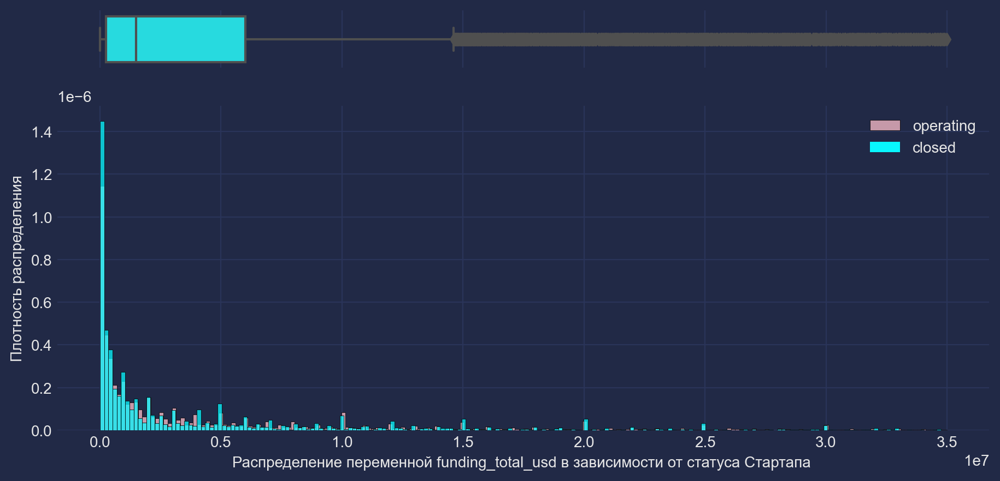

In [19]:
#посмотрим, как распределяются значения переменной Общая сумма финансирования в USD в зависимости от Статуса
#вывожу до 0.9 квантиля
f, (ax_box, ax_hist) = plt.subplots(
    2, sharex = True, gridspec_kw = {'height_ratios': (.15, .85)}, figsize = (11,5)
)

sns.boxplot(x = df_train[df_train['funding_total_usd']<df_train['funding_total_usd'].quantile(0.9)]['funding_total_usd'], 
            ax = ax_box,
           )
sns.histplot(x = df_train[((df_train['status'] == 'operating') & (df_train['funding_total_usd']<df_train['funding_total_usd'].quantile(0.9)))]['funding_total_usd'],
             stat='density', common_norm=False, ax = ax_hist, bins = 200, color = 'pink')
sns.histplot(x = df_train[((df_train['status'] == 'closed') & (df_train['funding_total_usd']<df_train['funding_total_usd'].quantile(0.9)))]['funding_total_usd'],
             stat='density', common_norm=False, ax = ax_hist, bins = 200)


ax_box.set(xlabel = '')
ax_hist.set(xlabel = 'Распределение переменной funding_total_usd в зависимости от статуса Стартапа ')
ax_hist.set(ylabel = 'Плотность распределения')
ax_hist.legend(['operating', 'closed'])

plt.show()

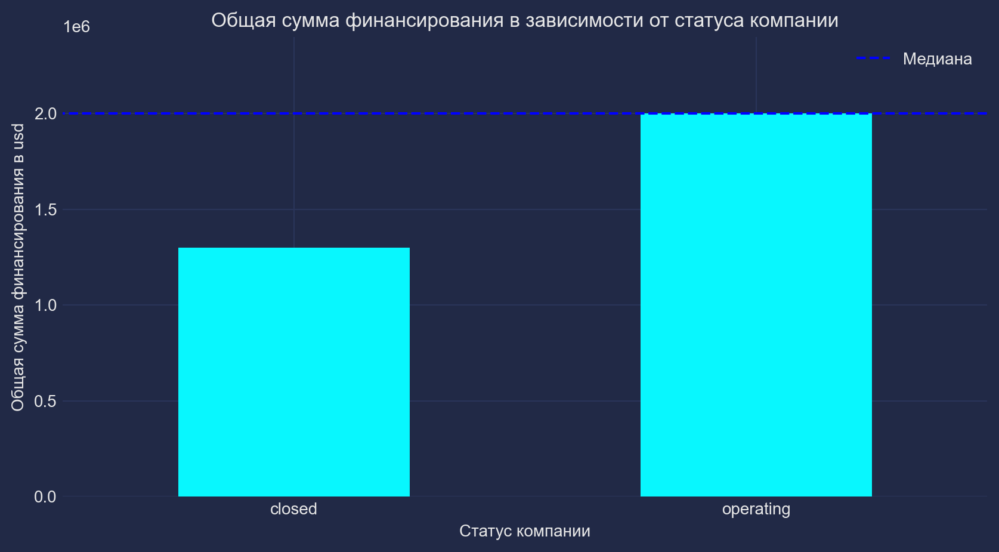

In [20]:
#посмотрим на различие медиан для двух групп стартапов в зависимости от Статуса
#выбор медианы обусловлен ее робастностью

out = df_train.groupby('status').funding_total_usd.median()

out.plot(kind = 'bar', stacked = True, figsize = (10,5))

plt.title('Общая сумма финансирования в зависимости от статуса компании')
plt.xlabel('Статус компании')
plt.ylabel('Общая сумма финансирования в usd')
plt.xticks(rotation = 0, horizontalalignment = 'center')
plt.ylim(0, 2400000)
plt.hlines(y = df_train['funding_total_usd'].median(), xmin = -1, xmax = 4, color = 'blue', linestyle = 'dashed')
plt.legend(['Медиана'])

plt.show()

- Переменная **Общая сумма финансирования в USD (funding_total_usd** является количественной переменной (вещественной) и включает в себя 42447 непропуoенных значений. 
- В данных присутвуют 10060 пропусков. 
- Максимальное значение переменной - 30 079 503 000 usd, минимальное - 1 usd. Среднее значение = 18 247 481 usd, медиана - 2 000 000 usd, что указывает на достаточно сильное отклонение среднего от медианного, что может свидетельствовать о правостороннем скосе в распределении. 
- Значение skewness = 108.79614, это говорит о том, что распределение скошено вправо, то есть хвост распространяется на правую часть распределения.

*Сравним распределения в двух выборках (в зависимости от Статуса стартапов) с использованием статистического теста (ttest для независимых выборок).* 

**Гипотезы**

H 0 : µ 1 = µ 2 (две средние совокупности равны - средняя сумма финансирования для закрывшихся стартапов **равна** средней сумме финансирования для действующих стартапов)

H 1 : µ 1 ≠ µ 2 (две средние совокупности не равны - средняя сумма финансирования для закрывшихся стартапов **не равна** средней сумме финансирования для действующих стартапов)

Уровень значимости **a = 0.05**

In [21]:
#проверим дисперсии выборок

var_operating = np.var(df_train[df_train['status'] == 'operating']['funding_total_usd'])
var_closed = np.var(df_train[df_train['status'] == 'closed']['funding_total_usd'])

samples_var = var_operating/var_closed
print(f'Большая дисперсия выборки к меньшей составляет {samples_var:.1f} \n')


#проводим ttest для независимых выборок при условии неравенства дисперсий
a = 0.05
stats, pvalue = stats.ttest_ind(df_train[df_train['status'] == 'operating']['funding_total_usd']
                                        .dropna(), 
                df_train[df_train['status'] == 'closed']['funding_total_usd'].dropna(), 
                equal_var = False)[:2]

if pvalue < a:
    print('Отвергаем нулевую гипотезу, полученное p-значение меньше установленного уровня значимости, между двумя выборками есть существенные различия')
else:
    print('Принимаем нулевую гипотезу, полученное p-значение больше установленного уровня значимости, существенных различий между двумя выборками нет')


Большая дисперсия выборки к меньшей составляет 17.5 

Отвергаем нулевую гипотезу, полученное p-значение меньше установленного уровня значимости, между двумя выборками есть существенные различия


In [22]:
df_train['status'].value_counts()

status
operating    47599
closed        4917
Name: count, dtype: int64

- **90.6% всех представленных в наборе данных стартапов действуют, 9.4 - закрыты. Что говорит о несбалансированности выборки.**

In [23]:
#выведем общее число представленных стран
len(df_train['country_code'].unique())

135

In [24]:
df_train['country_code'].value_counts().sort_values(ascending = False).head(5)

country_code
USA    29702
GBR     2925
CAN     1540
IND     1276
CHN     1240
Name: count, dtype: int64

In [25]:
df_train['country_code'].isna().value_counts()

country_code
False    47014
True      5502
Name: count, dtype: int64

In [26]:
#выведем общее число штатов стран
print(f'Число уникальных штатов: {len(df_train["state_code"].unique())}')

df_train['state_code'].isna().value_counts()

Число уникальных штатов: 301


state_code
False    45753
True      6763
Name: count, dtype: int64

In [27]:
#выведем общее число регионов стран
len(df_train['region'].unique())

1037

In [28]:
#выведем общее число городов стран
len(df_train['city'].unique())

4478

- В наборе данных присутвует 4 переменные, которые характеризуют географическое расположение стартапа и неизбежно связаны между собой (то есть между данными признаками существует корреляция). Для обучения модели буду использовать только сведения о стране стартапа.

In [29]:
pd.crosstab(index = df_train['status'],columns = df_train['funding_rounds'],
                                    normalize = 'index')

funding_rounds,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
status,,,,,,,,,,,,,,,,,,,
closed,0.76,0.15,0.04,0.02,0.01,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
operating,0.62,0.19,0.09,0.04,0.02,0.01,0.01,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


In [30]:
df_train[df_train['funding_rounds']>8]['status'].sort_values().head(21)

50318       closed
40478       closed
34658       closed
10442       closed
2538        closed
23637       closed
23832       closed
36473    operating
36457    operating
36328    operating
36192    operating
36501    operating
35839    operating
35635    operating
35325    operating
35074    operating
34788    operating
34754    operating
36209    operating
36533    operating
67       operating
Name: status, dtype: object

- так как после прохождения 8 раундов финансирования праткические все стартапы действующие, объединяю все в один класс

In [31]:
df_train.loc[df_train['funding_rounds']>=8, 'funding_rounds'] = 8

In [32]:
pd.crosstab(index = df_train['status'],columns = df_train['funding_rounds'],
                                    normalize = 'index')

funding_rounds,1,2,3,4,5,6,7,8
status,,,,,,,,
closed,0.76,0.15,0.04,0.02,0.01,0.01,0.00,0.00
operating,0.62,0.19,0.09,0.04,0.02,0.01,0.01,0.01


In [33]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52516 entries, 0 to 52515
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   name               52515 non-null  object        
 1   category_list      50051 non-null  object        
 2   funding_total_usd  42447 non-null  float64       
 3   status             52516 non-null  object        
 4   country_code       47014 non-null  object        
 5   state_code         45753 non-null  object        
 6   region             46157 non-null  object        
 7   city               46157 non-null  object        
 8   funding_rounds     52516 non-null  int64         
 9   founded_at         52516 non-null  datetime64[ns]
 10  first_funding_at   52516 non-null  datetime64[ns]
 11  last_funding_at    52516 non-null  datetime64[ns]
 12  closed_at          4917 non-null   datetime64[ns]
dtypes: datetime64[ns](4), float64(1), int64(1), object(7)
memory 

In [34]:
df_train.describe().T

,count,mean,min,25%,50%,75%,max,std
funding_total_usd,42447.00,18247480.66,1.00,336027.50,2000000.00,10000000.00,30079503000.00,187117301.32
funding_rounds,52516.00,1.73,1.00,1.00,1.00,2.00,8.00,1.29
founded_at,52516,2008-11-04 09:44:16.196206848,1970-02-05 00:00:00,2006-10-01 00:00:00,2010-10-01 00:00:00,2013-01-01 00:00:00,2016-04-02 00:00:00,NaN
first_funding_at,52516,2011-07-17 04:45:33.247010304,1977-05-15 00:00:00,2009-10-12 00:00:00,2012-07-23 00:00:00,2014-04-01 00:00:00,2015-12-05 00:00:00,NaN
last_funding_at,52516,2012-06-27 16:29:42.313961472,1977-05-15 00:00:00,2011-02-01 00:00:00,2013-08-30 00:00:00,2014-11-17 00:00:00,2015-12-07 00:00:00,NaN
closed_at,4917,2012-01-16 16:14:21.012812544,1983-10-06 00:00:00,2009-09-18 00:00:00,2012-09-15 00:00:00,2015-04-23 00:00:00,2017-10-21 00:00:00,NaN


- В тренировочном наборе данных присутствуют 13 применных, включая 1 идентификационную ('name'), 1 - целевую ('status') и 11 входных переменных.
- В наборе присутвуют 4 признака даты с большим числом уникальных значений. Кроме того переменная closed_at прямо говорит о закрытии стартапа, утечка информации.
- Также набор данных включает в себя 4 переменные, характеризующие географическое расположение стартапа, переменные связаны между собой.
- В наборе данных также присутствуют 2 числовые переменные - funding_total_usd (вещественная) и funding_rounds (целочисленная). Общая сумма финансирования в USD имеет сильный скос вправо. В переменной funding_rounds были выделены в одну группу все стартапы, прошедшие более 8 раундов финансирования. 

## Создание новых признаков на основе имеющихся

In [35]:
print(f'Число пропущенных значений переменной Дата последнего раунда финансирования: \n{df_train.last_funding_at.isna().value_counts()}')
print(f'\nЧисло уникальных дат последнего раунда финансирования: {len(df_train.last_funding_at.unique())}')

Число пропущенных значений переменной Дата последнего раунда финансирования: 
last_funding_at
False    52516
Name: count, dtype: int64

Число уникальных дат последнего раунда финансирования: 4305


In [36]:
print(f'Число пропущенных значений переменной Дата первого раунда финансирования: \n{df_train.first_funding_at.isna().value_counts()}')
print(f'\nЧисло уникальных дат первого раунда финансирования: {len(df_train.first_funding_at.unique())}')

Число пропущенных значений переменной Дата первого раунда финансирования: 
first_funding_at
False    52516
Name: count, dtype: int64

Число уникальных дат первого раунда финансирования: 4603


In [37]:
#создаем переменную first_last_funfing_at_days - число дней между первым и последним раунадми финансирования
df_train['first_last_funfing_at_days'] = (df_train.last_funding_at - df_train.first_funding_at).dt.days

In [38]:
pd.pivot_table(data = df_train, 
               columns = 'status', 
               values = 'first_last_funfing_at_days',
              aggfunc = ['count', 'mean', 'std', 'min', 'median', 'max']).T

first_last_funfing_at_days
       status                               
count  closed                        4917.00
       operating                    47599.00
mean   closed                         181.57
       operating                      363.52
std    closed                         471.18
       operating                      705.07
min    closed                           0.00
       operating                        0.00
median closed                           0.00
       operating                        0.00
max    closed                        4353.00
       operating                    10807.00

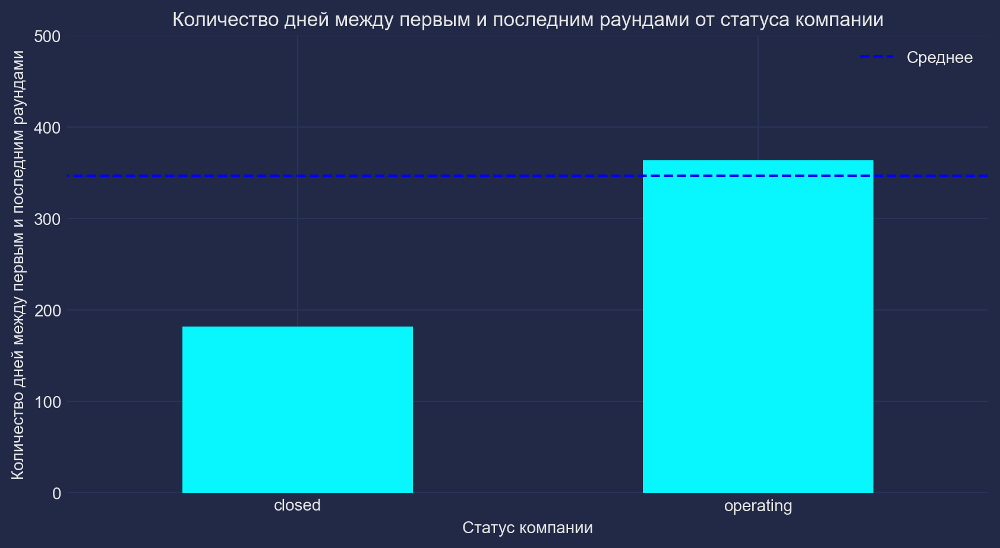

In [39]:
#посмотрим на различие средних для двух групп стартапов в зависимости от Статуса

out = df_train.groupby('status').first_last_funfing_at_days.mean()

out.plot(kind = 'bar', stacked = True, figsize = (10,5))

plt.title('Количество дней между первым и последним раундами от статуса компании')
plt.xlabel('Статус компании')
plt.ylabel('Количество дней между первым и последним раундами')
plt.xticks(rotation = 0, horizontalalignment = 'center')
plt.ylim(0, 500)
plt.hlines(y = df_train['first_last_funfing_at_days'].mean(), xmin = -1, xmax = 4, color = 'blue', linestyle = 'dashed')
plt.legend(['Среднее'])

plt.show()

- Также в тренировочном наборе данных есть данные об прекращении существования стартапа. На основе двух переменных - дата прекращения существования стартапа и даты его открытия создадим переменную lifetime, в которой содержатася данные о времени существования стартапа. Так как данные взяты за временной период Временной период - '1970-01-01' по '2018-01-01', заполним пропуски в переменной Дата закрытия стартапа датой последней выгрузки. 

In [40]:
#создаем переменную Время существования стартапа в днях
df_train['lifetime'] = (df_train.closed_at.fillna('2018-01-01') - df_train.founded_at).dt.days

In [41]:
df_train.columns

Index(['name', 'category_list', 'funding_total_usd', 'status', 'country_code',
       'state_code', 'region', 'city', 'funding_rounds', 'founded_at',
       'first_funding_at', 'last_funding_at', 'closed_at',
       'first_last_funfing_at_days', 'lifetime'],
      dtype='object')

In [42]:
df_train['lifetime'].describe()

count   52516.00
mean     3140.83
std      2147.82
min        19.00
25%      1739.00
50%      2557.00
75%      4018.00
max     17378.00
Name: lifetime, dtype: float64

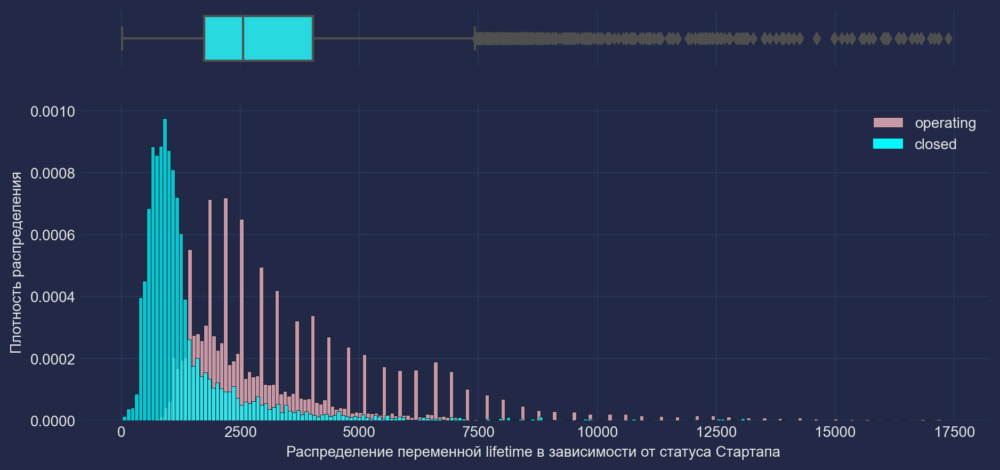

In [43]:
#посмотрим, как распределяются значения переменной Общая сумма финансирования в USD в зависимости от Статуса
#вывожу до 0.9 квантиля
f, (ax_box, ax_hist) = plt.subplots(
    2, sharex = True, gridspec_kw = {'height_ratios': (.15, .85)}, figsize = (11,5)
)

sns.boxplot(x = df_train['lifetime'], 
            ax = ax_box)
sns.histplot(x = df_train[df_train['status'] == 'operating']['lifetime'],
             stat='density', common_norm=False, ax = ax_hist, bins = 200, color = 'pink')
sns.histplot(x = df_train[df_train['status'] == 'closed']['lifetime'],
             stat='density', common_norm=False, ax = ax_hist, bins = 200)


ax_box.set(xlabel = '')
ax_hist.set(xlabel = 'Распределение переменной lifetime в зависимости от статуса Стартапа ')
ax_hist.set(ylabel = 'Плотность распределения')
ax_hist.legend(['operating', 'closed'])

plt.show()

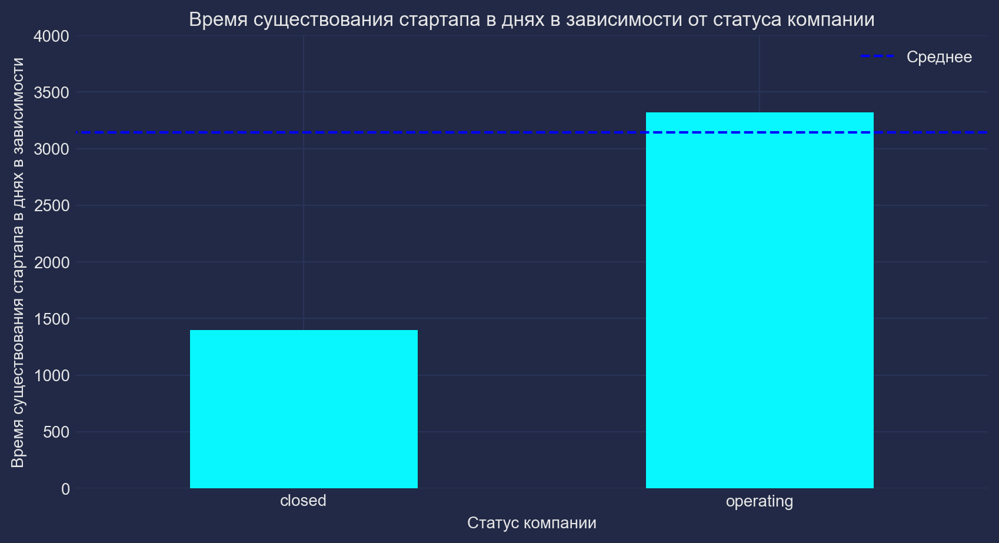

In [44]:
#посмотрим на различие средних для двух групп стартапов в зависимости от Статуса

out = df_train.groupby('status').lifetime.mean()

out.plot(kind = 'bar', stacked = True, figsize = (10,5))

plt.title('Время существования стартапа в днях в зависимости от статуса компании')
plt.xlabel('Статус компании')
plt.ylabel('Время существования стартапа в днях в зависимости')
plt.xticks(rotation = 0, horizontalalignment = 'center')
plt.ylim(0, 4000)
plt.hlines(y = df_train['lifetime'].mean(), xmin = -1, xmax = 4, color = 'blue', linestyle = 'dashed')
plt.legend(['Среднее'])

plt.show()

- Так как выше мы заметили, что переменная Категория включает в себя несколько категорий одновременно, попробуем выделить первые две категорий в списке, на основе коорых предварительно создаем 2 переменные.

In [45]:
#создаем список уникальных категорий 

cat_uniq = []
for i in range(30):
    cat_uniq.append(df_train['category_list'].str.split('|', expand=True)[i].unique().tolist())
    
cat_uniq_f = []
for i in range(30):
    for t in cat_uniq[i]:
        cat_uniq_f.append(t)

In [46]:
#создаем датафрейм из уникальных категорий, сортированных по убыванию

cat_uniq = pd.DataFrame(pd.DataFrame(cat_uniq_f)[0].value_counts().sort_values(ascending = True)).reset_index()[0]
len(cat_uniq)

854

In [47]:
#создаем переменную категории, в которую включаем наиболее часто упоминаемые категории

def categories(df_train):
    for u in cat_uniq.tolist():
        if str(u).lower() in str(df_train['category_list']).lower():
            return u
        
df_train['category'] = df_train.apply(categories, axis = 1)

len(df_train['category'].unique())

775

In [48]:
#заполняем пропуски в переменной категории значением "Неизвестно"
df_train.loc[df_train['category'].isna(), 'category'] = 'Неизвестно'

In [49]:
f = pd.DataFrame(df_train[(df_train['country_code'].isna()) & (df_train['status'] == 'closed')][['lifetime']].describe())
f.columns = ['closed']
f['operating'] = df_train[(df_train['country_code'].isna()) & (df_train['status'] == 'operating')][['lifetime']].describe()
f

,closed,operating
count,1286.00,4216.00
mean,1056.30,2807.70
std,903.91,1838.26
min,70.00,748.00
25%,702.00,1628.00
50%,921.00,2192.00
75%,1150.75,3315.75
max,17004.00,17167.00


In [50]:
f = pd.DataFrame(df_train[(df_train['category_list'].isna()) & (df_train['status'] == 'closed')][['lifetime']].describe())
f.columns = ['closed']
f['operating'] = df_train[(df_train['category_list'].isna()) & (df_train['status'] == 'operating')][['lifetime']].describe()
f

,closed,operating
count,729.00,1736.00
mean,1223.18,3171.28
std,1287.69,2461.68
min,329.00,762.00
25%,785.00,1550.75
50%,986.00,2282.50
75%,1207.00,4018.00
max,17004.00,17167.00


In [51]:
#создаем искусственную переменную на основе пустых значений в переменных category_list и country_code и значения
#переменной lifetime

df_train['a'] = 5


df_train.loc[(df_train['lifetime'] <2192) 
             & (df_train['country_code'].isna()), 'a'] = 4

df_train.loc[(df_train['lifetime'] <2282) 
             & (df_train['category_list'].isna()), 'a'] = 3

df_train.loc[(df_train['lifetime'] <1300) 
             & (df_train['category_list'].isna())
             & (df_train['country_code'].isna()), 'a'] = 2

df_train.loc[(df_train['lifetime'] <794) 
             & (df_train['category_list'].isna())
             & (df_train['country_code'].isna()), 'a'] = 1

In [52]:
pd.pivot_table(data = df_train[['status', 'a', 'name']], index = 'status', columns = 'a', aggfunc = 'count')

name                       
a            1    2    3     4      5
status                               
closed     122  298  263   758   3475
operating    2   80  786  1717  45014

In [53]:
#создаем переменную год первого раунда финансирования
df_train['first_funding_at_year'] = df_train['first_funding_at'].dt.year

In [54]:
#создаем переменную год последнего раунда финансирования
df_train['last_funding_at_year'] = df_train['last_funding_at'].dt.year

In [55]:
#заполняем пропуски в переменной funding_rounds на основе категорий
for i in df_train['category'].unique():
    df_train.loc[(df_train['category'] == i) & (df_train['funding_rounds'].isna()), 'funding_rounds'] = \
    pd.DataFrame(df_train.loc[(df_train['category'] == i), 'funding_rounds']\
    .value_counts().sort_values(ascending = False)).reset_index().iloc[0, 0]

In [56]:
#заполняем пропуски в переменной funding_total_usd на основе категорий и funding_rounds

for i in df_train['category'].unique():
    df_train.loc[(df_train['category'] == i) & (df_train['funding_total_usd'].isna()), 'funding_total_usd'] = \
    df_train.loc[(df_train['category'] == i), 'funding_total_usd'].median()

    
for i in df_train['funding_rounds'].unique():
    df_train.loc[(df_train['funding_rounds'] == i) & (df_train['funding_total_usd'].isna()), 'funding_total_usd'] = \
    df_train.loc[(df_train['funding_rounds'] == i), 'funding_total_usd'].median()

In [57]:
#логарифмируем funding_total_usd, чтобы избавиться от скоса
df_train['log_funding_total_usd'] = np.log(df_train['funding_total_usd'])

In [58]:
df_train['log_funding_total_usd'].describe()

count   52516.00
mean       14.37
std         2.18
min         0.00
25%        13.12
50%        14.51
75%        15.78
max        24.13
Name: log_funding_total_usd, dtype: float64

In [59]:
df_train['log_lifetime'] = np.log(df_train['lifetime'])

In [60]:
df_train['log_lifetime'].describe()

count   52516.00
mean        7.86
std         0.62
min         2.94
25%         7.46
50%         7.85
75%         8.30
max         9.76
Name: log_lifetime, dtype: float64

In [61]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52516 entries, 0 to 52515
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   name                        52515 non-null  object        
 1   category_list               50051 non-null  object        
 2   funding_total_usd           52516 non-null  float64       
 3   status                      52516 non-null  object        
 4   country_code                47014 non-null  object        
 5   state_code                  45753 non-null  object        
 6   region                      46157 non-null  object        
 7   city                        46157 non-null  object        
 8   funding_rounds              52516 non-null  int64         
 9   founded_at                  52516 non-null  datetime64[ns]
 10  first_funding_at            52516 non-null  datetime64[ns]
 11  last_funding_at             52516 non-null  datetime64

In [62]:
df_train['country_code'] = df_train['country_code'].fillna('Неизвестно')

In [63]:
df_train.columns

Index(['name', 'category_list', 'funding_total_usd', 'status', 'country_code',
       'state_code', 'region', 'city', 'funding_rounds', 'founded_at',
       'first_funding_at', 'last_funding_at', 'closed_at',
       'first_last_funfing_at_days', 'lifetime', 'category', 'a',
       'first_funding_at_year', 'last_funding_at_year',
       'log_funding_total_usd', 'log_lifetime'],
      dtype='object')

In [64]:
#создаём список с наименованиями непрерывных признаков
interval_cols = ['log_funding_total_usd', 'funding_total_usd']

interval columns not set, guessing: ['funding_total_usd', 'funding_rounds', 'first_last_funfing_at_days', 'lifetime', 'a', 'first_funding_at_year', 'last_funding_at_year', 'log_funding_total_usd', 'log_lifetime']


/Users/pillow/opt/anaconda3/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/Users/pillow/opt/anaconda3/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/Users/pillow/opt/anaconda3/lib/python3.9/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.4' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
/Users/pillow/opt/anaconda3/lib/python3.9/site-packages/pandas/core/arrays/masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.2' currently installed).
 

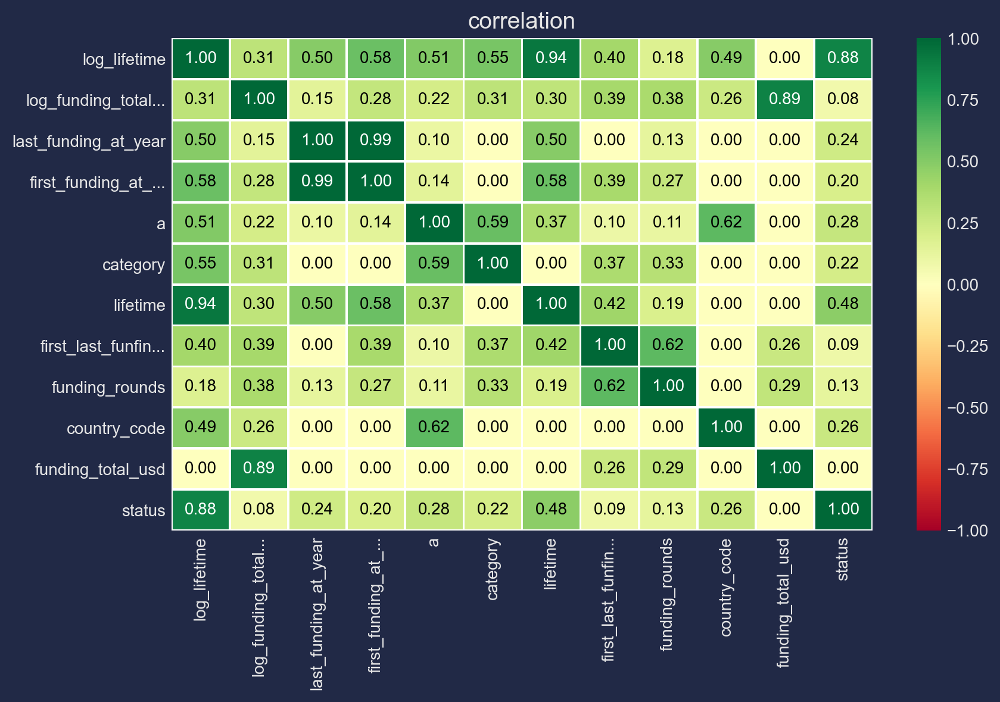

In [65]:
#строим корреляционную матрицу с помощью phik

phik_overview = phik_matrix(df_train.set_index('name')
                            [['status', 'funding_total_usd', 'country_code','funding_rounds', 
                             'first_last_funfing_at_days', 'lifetime', 'category', 'a',
                             'first_funding_at_year', 'last_funding_at_year',
                             'log_funding_total_usd', 'log_lifetime']].sample(3000))

plot_correlation_matrix(
    phik_overview.values,
    x_labels=phik_overview.columns,
    y_labels=phik_overview.index,
    figsize=(9,6)
);

Как видим из корреляционной матрицы, между целевой переменной и большей частью входные существует связь. Целевая переменная Статус наиболее сильно корреляирует с переменной lifetime. 

**Для обучения и построения прогноза будут использоваться следующие переменные набора данных:**
- country_code
- funding_rounds
- first_funding_at_year
- a
- last_funding_at_year
- log_funding_total_usd
- log_lifetime
- category
- first_last_funfing_at_days
- lifetime

## Исследовательский анализ тестового набора данных

In [66]:
#выведем отчет для тестового набора данных
profile_test = ProfileReport(df_test)
profile_test

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [67]:
df_test.sample(3, random_state = state)

,name,category_list,funding_total_usd,country_code,state_code,region,city,funding_rounds,first_funding_at,last_funding_at,lifetime
10768,Ebid.co.zw,Networking,2000.00,NaN,NaN,NaN,NaN,1,2014-05-29,2014-05-29,1814
731,SenseLabs (formerly Neurotopia),Hardware + Software|Health and Wellness|Sports,4891800.00,USA,CA,SF Bay Area,San Francisco,2,2013-10-25,2014-03-10,3287
9984,Bazari,NaN,NaN,NaN,NaN,NaN,NaN,1,2010-09-02,2010-09-02,2922


In [68]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13125 entries, 0 to 13124
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   name               13125 non-null  object        
 1   category_list      12534 non-null  object        
 2   funding_total_usd  10547 non-null  float64       
 3   country_code       11743 non-null  object        
 4   state_code         11430 non-null  object        
 5   region             11536 non-null  object        
 6   city               11538 non-null  object        
 7   funding_rounds     13125 non-null  int64         
 8   first_funding_at   13125 non-null  datetime64[ns]
 9   last_funding_at    13125 non-null  datetime64[ns]
 10  lifetime           13125 non-null  int64         
dtypes: datetime64[ns](2), float64(1), int64(2), object(6)
memory usage: 1.1+ MB


In [69]:
df_train['funding_total_usd'].describe()

count         52516.00
mean       15229808.77
std       168348476.00
min               1.00
25%          500000.00
50%         2000000.00
75%         7126854.39
max     30079503000.00
Name: funding_total_usd, dtype: float64

In [70]:
df_test['funding_total_usd'].describe()

count        10547.00
mean      16549102.70
std       92172825.63
min              1.00
25%         320000.00
50%        2000000.00
75%       10000000.00
max     4715000000.00
Name: funding_total_usd, dtype: float64

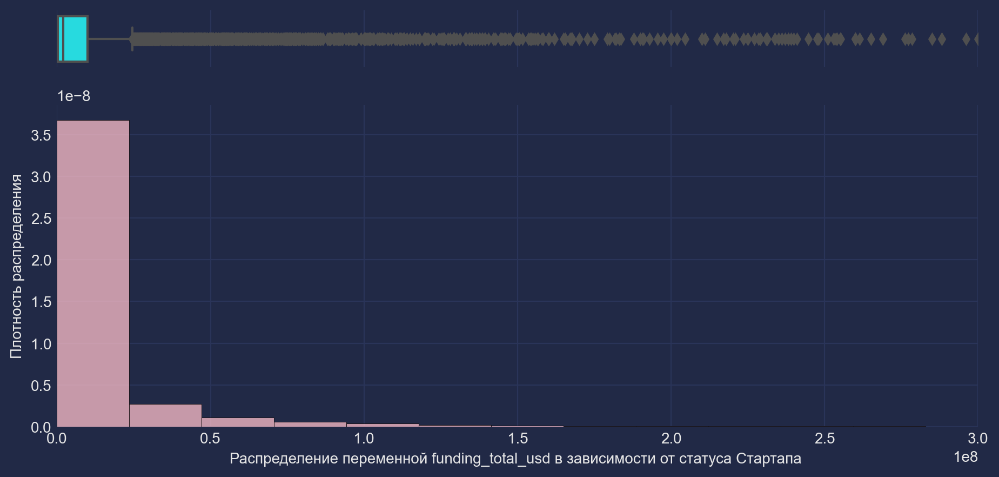

In [71]:
#посмотрим, как распределяются значения переменной Общая сумма финансирования в USD
f, (ax_box, ax_hist) = plt.subplots(
    2, sharex = True, gridspec_kw = {'height_ratios': (.15, .85)}, figsize = (11,5)
)

sns.boxplot(x = df_test['funding_total_usd'], 
            ax = ax_box,
           )
sns.histplot(x = df_test['funding_total_usd'],
             stat='density', common_norm=False, ax = ax_hist, bins = 200, color = 'pink')


ax_box.set(xlabel = '')
ax_hist.set(xlabel = 'Распределение переменной funding_total_usd в зависимости от статуса Стартапа ')
ax_hist.set(ylabel = 'Плотность распределения')
plt.xlim(0, 300000000)
plt.show()

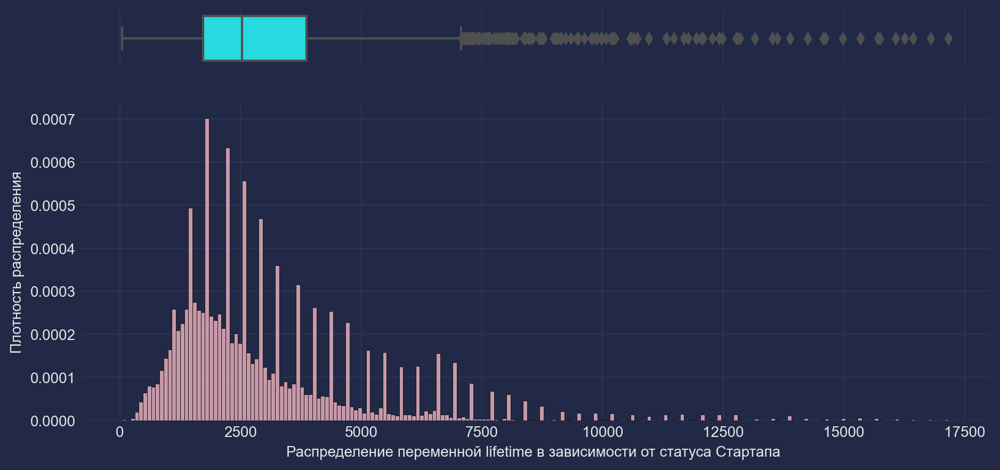

In [72]:
#посмотрим, как распределяются значения переменной Общая сумма финансирования в USD
f, (ax_box, ax_hist) = plt.subplots(
    2, sharex = True, gridspec_kw = {'height_ratios': (.15, .85)}, figsize = (11,5)
)

sns.boxplot(x = df_test['lifetime'], 
            ax = ax_box,
           )
sns.histplot(x = df_test['lifetime'],
             stat='density', common_norm=False, ax = ax_hist, bins = 200, color = 'pink')


ax_box.set(xlabel = '')
ax_hist.set(xlabel = 'Распределение переменной lifetime в зависимости от статуса Стартапа ')
ax_hist.set(ylabel = 'Плотность распределения')

plt.show()

In [73]:
df_test.columns

Index(['name', 'category_list', 'funding_total_usd', 'country_code',
       'state_code', 'region', 'city', 'funding_rounds', 'first_funding_at',
       'last_funding_at', 'lifetime'],
      dtype='object')

- Структура распределений переменных тестового набора схожа с распределением переменных тренировочного набора.

## Создание переменных в тестовом наборе данных

In [74]:
def categories(df_test):
    for u in cat_uniq.tolist():
        if str(u).lower() in str(df_test['category_list']).lower():
            return u
        
df_test['category'] = df_test.apply(categories, axis = 1)


In [75]:
df_test.loc[df_test['category'].isna(), 'category'] = 'Неизвестно'

In [76]:
df_test.loc[df_test['funding_rounds']>=8, 'funding_rounds'] = 8

In [77]:
df_test['a'] = 5

df_test.loc[(df_test['lifetime'] <2192) 
             & (df_test['country_code'].isna()), 'a'] = 4

df_test.loc[(df_test['lifetime'] <2282) 
             & (df_test['category_list'].isna()), 'a'] = 3

df_test.loc[(df_test['lifetime'] <1300) 
             & (df_test['category_list'].isna())
             & (df_test['country_code'].isna()), 'a'] = 2

df_test.loc[(df_test['lifetime'] <794) 
             & (df_test['category_list'].isna())
             & (df_test['country_code'].isna()), 'a'] = 1

In [78]:
df_test.dtypes

name                         object
category_list                object
funding_total_usd           float64
country_code                 object
state_code                   object
region                       object
city                         object
funding_rounds                int64
first_funding_at     datetime64[ns]
last_funding_at      datetime64[ns]
lifetime                      int64
category                     object
a                             int64
dtype: object

In [79]:
df_test['first_funding_at_year'] = df_test['first_funding_at'].dt.year

In [80]:
df_test['last_funding_at_year'] = df_test['last_funding_at'].dt.year

In [81]:
#создаем переменную first_last_funfing_at_days - число дней между первым и последним раунадми финансирования
df_test['first_last_funfing_at_days'] = (df_test.last_funding_at - df_test.first_funding_at).dt.days

In [82]:
#df_test['first_funding_at_month'] = df_test['first_funding_at'].dt.month

In [83]:
for i in df_test['category'].unique():
    df_test.loc[(df_test['category'] == i) & (df_test['funding_rounds'].isna()), 'funding_rounds'] = \
    df_test.loc[(df_test['category'] == i), 'funding_rounds'].median()

In [84]:
for i in df_test['category'].unique():
    df_test.loc[(df_test['category'] == i) & (df_test['funding_total_usd'].isna()), 'funding_total_usd'] = \
    df_test.loc[(df_test['category'] == i), 'funding_total_usd'].median()
    
for i in df_test['funding_rounds'].unique():
    df_test.loc[(df_test['funding_rounds'] == i) & (df_test['funding_total_usd'].isna()), 'funding_total_usd'] = \
    df_test.loc[(df_test['funding_rounds'] == i), 'funding_total_usd'].median()

In [85]:
df_test['log_funding_total_usd'] = np.log(df_test['funding_total_usd'])

In [86]:
df_test['log_lifetime'] = np.log(df_test['lifetime'])

In [87]:
df_test.columns

Index(['name', 'category_list', 'funding_total_usd', 'country_code',
       'state_code', 'region', 'city', 'funding_rounds', 'first_funding_at',
       'last_funding_at', 'lifetime', 'category', 'a', 'first_funding_at_year',
       'last_funding_at_year', 'first_last_funfing_at_days',
       'log_funding_total_usd', 'log_lifetime'],
      dtype='object')

In [88]:
test_df = df_test.set_index('name')[['country_code', 'funding_rounds', 'first_funding_at_year', 
                            'a', 'last_funding_at_year', 'log_funding_total_usd', 
                                     'log_lifetime', 'category', 'first_last_funfing_at_days', 'lifetime']]
test_df.head(3)

,country_code,funding_rounds,first_funding_at_year,a,last_funding_at_year,log_funding_total_usd,log_lifetime,category,first_last_funfing_at_days,lifetime
name,,,,,,,,,,
Crystalsol,NIC,1.00,2009,5,2009,14.85,8.16,Clean Technology,0,3501
JBI Fish & Wings,USA,1.00,2010,5,2010,13.89,7.91,Hospitality,0,2717
COINPLUS,LUX,2.00,2014,5,2014,12.97,7.17,Finance,126,1295


In [89]:
test_df['country_code'] = test_df['country_code'].fillna('Неизвестно')

In [90]:
test_df['funding_rounds'] = test_df['funding_rounds'].astype('int')

In [91]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13125 entries, Crystalsol to RingCentral
Data columns (total 10 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   country_code                13125 non-null  object 
 1   funding_rounds              13125 non-null  int64  
 2   first_funding_at_year       13125 non-null  int32  
 3   a                           13125 non-null  int64  
 4   last_funding_at_year        13125 non-null  int32  
 5   log_funding_total_usd       13125 non-null  float64
 6   log_lifetime                13125 non-null  float64
 7   category                    13125 non-null  object 
 8   first_last_funfing_at_days  13125 non-null  int64  
 9   lifetime                    13125 non-null  int64  
dtypes: float64(2), int32(2), int64(4), object(2)
memory usage: 1.0+ MB


## обучение модели

In [92]:
#кодируем целевую переменную: 1 - operating, 0 - closed
lab_enc = LabelEncoder()
df_train['status'] = lab_enc.fit_transform(df_train['status'])

In [93]:
#разбиваем набор данных на тренировочный и тестовый
X_train, X_test, y_train, y_test = train_test_split(
    df_train.set_index('name')[['country_code', 'funding_rounds',
                             'category', 'a', 'lifetime',
                             'first_funding_at_year', 'log_lifetime',
                             'last_funding_at_year', 'log_funding_total_usd']], 
    df_train.set_index('name')['status'], 
    test_size = 0.20, random_state = state, stratify = df_train['status']
)

In [94]:
#проверяем размерности тренировочного и валидационного наборов данных
pd.DataFrame(list(
    {'X_train' : [X_train.shape[0], X_train.shape[1]],
    'X_test' : [X_test.shape[0],X_test.shape[1]],
     'y_train' : [y_train.shape[0]],
     'y_test' : [y_test.shape[0]]}.items())).set_index(0).T

,X_train,X_test,y_train,y_test
1,"[42012, 9]","[10504, 9]",[42012],[10504]


In [95]:
X_train.columns

Index(['country_code', 'funding_rounds', 'category', 'a', 'lifetime',
       'first_funding_at_year', 'log_lifetime', 'last_funding_at_year',
       'log_funding_total_usd'],
      dtype='object')

In [96]:
#определяем спсиок числовых и категориальных переменных для кодирования
num_columns = ['log_funding_total_usd', 
               'log_lifetime', 
               'funding_rounds', 'a', 'lifetime',]

ohe_columns = ['country_code', 'category', 
               'first_funding_at_year', 'last_funding_at_year']

In [97]:
#создаем папйплайн для обработки категориальных переменных

ohe_pipe = Pipeline(
    [
        ('ohe_simple_imputer',
         SimpleImputer(missing_values = np.nan, strategy = 'most_frequent')),
        ('ohe_encoding',
        OneHotEncoder(drop = 'first', handle_unknown = 'ignore', sparse_output = False))
    ]
)

In [98]:
# создаём общий пайплайн для подготовки данных
data_preprocessor = ColumnTransformer(
    [
        ('ohe', ohe_pipe, ohe_columns),
        ('num_columns', RobustScaler(), num_columns),
        ('num_columns_imp', SimpleImputer(missing_values = np.nan, strategy = 'mean'), num_columns)
    ], 
    remainder = 'passthrough'
)

### RandomForestClassifier

In [99]:
pipe_final = Pipeline(
    [
        ('preprocessor', data_preprocessor),
        ('model', RandomForestClassifier(
            n_estimators = 100,
            random_state = state))
    ]
)

In [100]:
pipe_final.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('ohe_simple_imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe_encoding',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['country_code', 'category',
                                                   'first_funding_at_year',
                                                   'last_funding_at_year']),
                                                 ('num_columns', RobustScaler(),
                                                  ['log_funding_total_usd',
                                                   'log_lifetime',
                                                   'funding_rounds', 'a',
                                                   'lifetime']),
                                                 ('num_columns_imp',
                                                  SimpleImputer(),
                                                  ['log_funding_total_usd',
                                                   'log_lifetime',
                                                   'funding_rounds', 'a',
                                                   'lifetime'])])),
                ('model', RandomForestClassifier(random_state=17))])

In [101]:
f1_score(y_train, pipe_final.predict(X_train))

0.9999737388061661

In [102]:
f1_score(y_test, pipe_final.predict(X_test))

0.9858480749219563

### XGBClassifier

In [103]:
xgb_1 = Pipeline(
    [
        ('preprocessor', data_preprocessor),
        ('model', xgb.XGBClassifier(n_estimators = 200,
                                    max_features = 'log'))
    ]
)

In [104]:
xgb_1.fit(X_train, y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('ohe_simple_imputer',
                                                                   SimpleImputer(strategy='most_frequent')),
                                                                  ('ohe_encoding',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['country_code', 'category',
                                                   'first_funding_at_year',
                                                   'last_funding_at_year']),
                                                 ('num_col...
                               feature_types=None, gamma=None, grow_policy=None,
                               importance_type=None,
                               interaction_constraints=None, learning_rate=None,
                               max_bin=None, max_cat_threshold=None,
                               max_cat_to_onehot=None, max_delta_step=None,
                               max_depth=None, max_features='log',
                               max_leaves=None, min_child_weight=None,
                               missing=nan, monotone_constraints=None,
                               multi_strategy=None, n_estimators=200,
                               n_jobs=None, num_parallel_tree=None, ...))])

In [105]:
f1_score(y_train, xgb_1.predict(X_train))

0.9927604411687837

In [106]:
f1_score(y_test, xgb_1.predict(X_test))

0.986339937434828

## Подбор гиперпараметров

In [107]:
#parameters = (
#    {
#        'model':[RandomForestClassifier(random_state=state)],
#        'model__max_features': ['sqrt', 'log', None]
#    }
#)

In [108]:
#rch = RandomizedSearchCV(
#    pipe_final,
#    parameters,
#    n_jobs = -1,
#    random_state = state,
#    scoring = 'f1',
#    cv = 3
#)

In [109]:
#rch.fit(X_train, y_train)

In [110]:
#rch.best_params_

In [111]:
#rch.best_score_

In [112]:
#f1_score(y_test, rch.best_estimator_.predict(X_test))

## Анализ порога

- *наибольшее значение f1 достигается при заданном пороге в 0.62.*

In [113]:
#формируем списки значения f1 в зависимости от порогов

scores = []
thresholds = []
for i in np.linspace(.0, 1.0, 30):
    threshold = i
    predicted_proba_test = xgb_1.predict_proba(X_test)
    predicted = (predicted_proba_test[:, 0] >= threshold).astype('int')
    predict_test = np.where(predicted==1, 0, 1).tolist()
    thresholds.append(i)
    scores.append(round(f1_score(y_test, predict_test), 4))

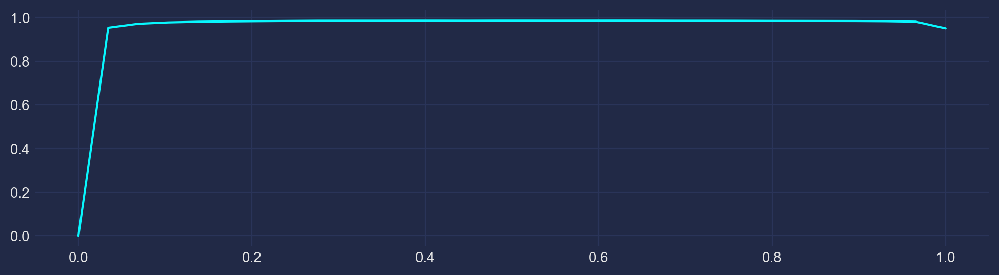

In [114]:
plt.figure(figsize=(12, 3))
plt.plot(thresholds, scores);

In [115]:
pd.DataFrame(thresholds, scores).reset_index().sort_values(by = 'index', ascending = False).head(7)

,index,0
18,0.99,0.62
15,0.99,0.52
17,0.99,0.59
19,0.99,0.66
14,0.99,0.48
16,0.99,0.55
11,0.99,0.38


## Оценка важности признаков

In [116]:
feature_imp_rf = pd.DataFrame(pipe_final._final_estimator.feature_importances_, 
                             data_preprocessor.get_feature_names_out(), columns = ['feature_important'])

feature_imp_rf[feature_imp_rf['feature_important']>0].sort_values(by = 'feature_important', ascending = False)[:12]

,feature_important
num_columns__lifetime,0.18
num_columns_imp__lifetime,0.17
num_columns__log_lifetime,0.17
num_columns_imp__log_lifetime,0.15
num_columns_imp__log_funding_total_usd,0.03
num_columns__log_funding_total_usd,0.03
ohe__last_funding_at_year_2015,0.02
num_columns_imp__a,0.02
ohe__first_funding_at_year_2015,0.02
num_columns__a,0.02


- важный вклад в предсказание класса вносят такие переменные как lifetime, unding_total_usd, first_funding_at_year, last_funding_at_year, a и country_code.
- наибольший вклад вносит переменная lifetime (0.18).

In [117]:
lr = LogisticRegression()

In [118]:
lr.fit(data_preprocessor.transform(X_train), y_train)

LogisticRegression()

In [119]:
plt.style.use('seaborn-whitegrid')
sns.set_style("darkgrid")

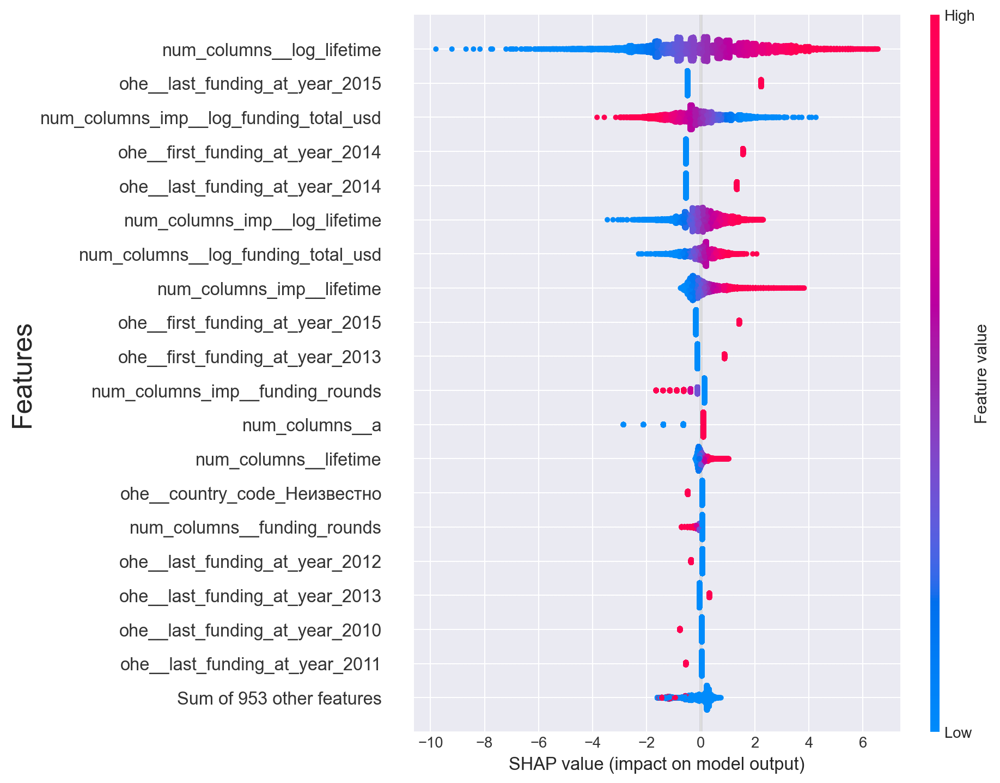

In [120]:

X_test_prep = pd.DataFrame(data_preprocessor.transform(X_test), columns = data_preprocessor.get_feature_names_out())

fig, ax = plt.gcf(), plt.gca()
fig.set_dpi(90)

ax.set_ylabel("Features", fontsize=20)

explainer = shap.LinearExplainer(lr, X_test_prep)
shap_values = explainer(X_test_prep)
shap.plots.beeswarm(shap_values, max_display = 20)

**Оценка вклада каждого признака в прогноз с помощью значений Шепли показала следующее:**
- более высокие значения переменной время существования стартапа в днях, Общая сумма финансирования в USD склоняют модель назначать класс 1 - operating;
- такие значений переменной Дата первого раунда финансирования, как 2013,2014 и 2015 года склоняют модель назначать класс 1 - operating;
- значения переменной Дата последнего раунда финансирования, как 2010, 2011 и 2012 года склоняют модель назначать класс 0 - closed

In [121]:
train_pred = pd.DataFrame([y_train.reset_index()['name'],
                           y_train.reset_index()['status'],
                           xgb_1.predict(X_train)]).T

In [122]:
test_pred = pd.DataFrame([y_test.reset_index()['name'],
                           y_test.reset_index()['status'],
                           xgb_1.predict(X_test)]).T
test_pred['probs'] = pd.DataFrame(xgb_1.predict_proba(X_test)).iloc[:, 0].tolist()

In [123]:
#выведем наблюдения с неверным прогнозом на валидационной выборке
test_pred[test_pred['status']!=test_pred['Unnamed 0']].sort_values(by = 'probs')[140:]

,name,status,Unnamed 0,probs
5791,Elixir Pharmaceuticals,0,1,0.16
8823,Investopresto,0,1,0.16
2994,CalciMedica,0,1,0.16
9385,Applied Isotope Technologies,0,1,0.16
1155,Shhmooze,0,1,0.17
...,...,...,...,...
6519,mi.tv,1,0,0.99
7590,Fintura,1,0,0.99
9751,Sun Animatics,1,0,0.99
8556,Mom Junction,1,0,0.99


In [124]:
X_test.reset_index()[X_test.reset_index()['name']=='7 Billion People']

,name,country_code,funding_rounds,category,a,lifetime,first_funding_at_year,log_lifetime,last_funding_at_year,log_funding_total_usd
3571,7 Billion People,USA,3,Analytics,5,2876,2009,7.96,2012,15.69


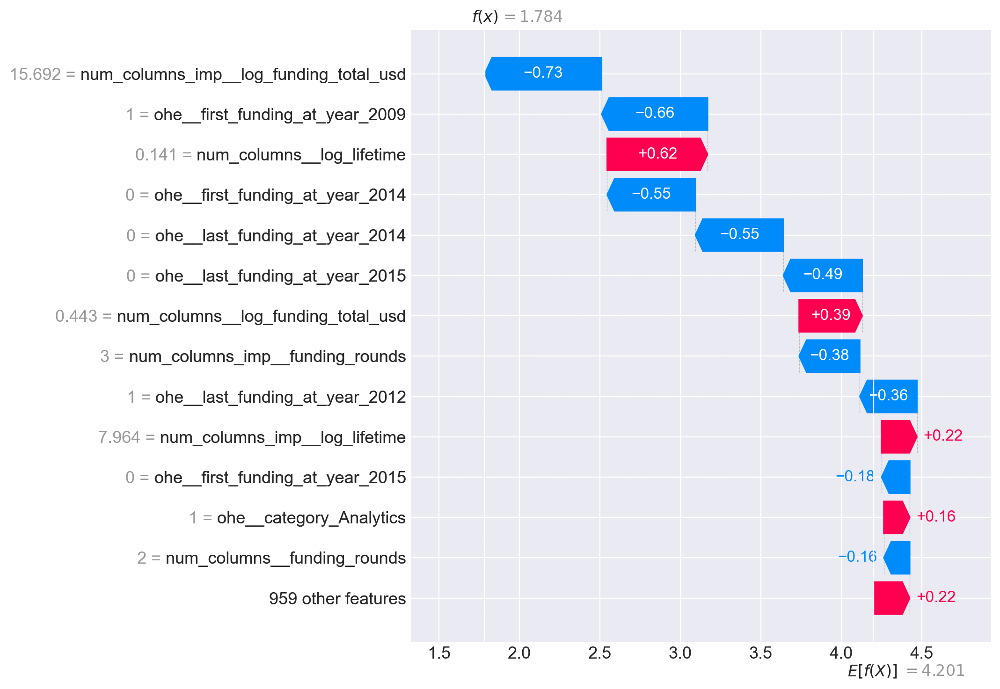

In [125]:
#посмотрим на вклад признаков в каждую в некоторые переменные.
shap.plots.waterfall(shap_values[X_test.reset_index()[X_test.reset_index()['name'] == '7 Billion People'].index[0]], max_display=14)

## Предсказание класса на тестовом наборе

In [126]:
threshold = 0.62
predicted_proba_test = xgb_1.predict_proba(test_df)
predicted = (predicted_proba_test[:, 0] >= threshold).astype('int')
predict_test = np.where(predicted==1, 0, 1).tolist()

In [127]:
test_df['status'] = predict_test

In [128]:
test_df['status'].value_counts()

status
1    12065
0     1060
Name: count, dtype: int64

In [129]:
test_df['status'] = lab_enc.inverse_transform(test_df['status'])

In [130]:
#test_df['status'] = np.where(test_df['status'] == 1, 'operating', 'closed')

In [131]:
test_df['status'].value_counts()

status
operating    12065
closed        1060
Name: count, dtype: int64

In [132]:
test_df['status'].to_csv('/Users/pillow/Documents/Portfolio/kaggle/test_prog.csv')

## PCA

In [133]:
from sklearn.decomposition import PCA

pca = PCA(n_components=5)

In [134]:
pca.fit(data_preprocessor.transform(X_train))

PCA(n_components=5)

In [135]:
X_train = pca.transform(data_preprocessor.transform(X_train))
X_test = pca.transform(data_preprocessor.transform(X_test))

In [136]:
test_df = pca.transform(data_preprocessor.transform(test_df))

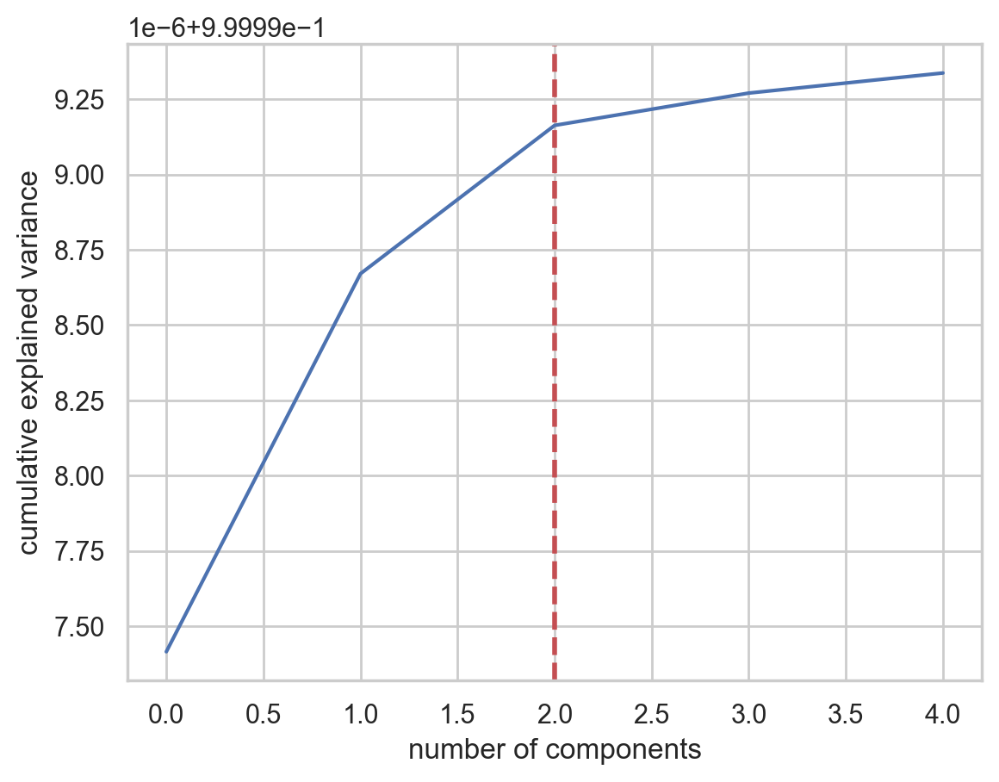

None

In [137]:
sns.set(style='whitegrid')
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.axvline(linewidth=2, color='r', linestyle = '--', x=2, ymin=0, ymax=1)
display(plt.show())
evr = pca.explained_variance_ratio_
cvr = np.cumsum(pca.explained_variance_ratio_)

In [138]:
test_pred = RandomForestClassifier(random_state = state).fit(X_train, y_train).predict(test_df)

predicted_proba_test = RandomForestClassifier(random_state = state).fit(X_train, y_train).predict_proba(test_df)

In [139]:
threshold = 0.62
predicted = (predicted_proba_test[:, 0] >= threshold).astype('int')
predict_test = np.where(predicted==1, 0, 1).tolist()

In [140]:
df_test['status'] = predict_test

In [141]:
out = df_test[['name', 'status']].set_index('name')

In [142]:
out['status'] = lab_enc.inverse_transform(out['status'])

In [143]:
out['status'].value_counts()

status
operating    12116
closed        1009
Name: count, dtype: int64

In [144]:
out['status'].to_csv('/Users/pillow/Documents/Portfolio/kaggle/test_prog.csv')